## Bank Marketing Campaign Dataset

In [1]:
# Importing libraries


import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score,r2_score,mean_squared_error,confusion_matrix
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics


## Step 1: ## Loading the dataset

In [2]:
df=pd.read_csv(r'Bank_Marketing_Campaign_Dataset.csv')  
df=pd.DataFrame(df)
print("Actual Dataset")
print(df.to_string())

Actual Dataset
                 occupation  age    education_level marital_status communication_channel call_month  call_day  call_duration  call_frequency previous_campaign_outcome conversion_status
0      administrative_staff   28        high_school        married          unidentified  September         9              1               1                successful     not_converted
1      administrative_staff   58       unidentified        married          unidentified       June         5            307               2              unidentified     not_converted
2                   jobless   40        high_school       divorced                mobile   February         4            113               1              unidentified     not_converted
3            retired_worker   63        high_school        married                mobile      April         7             72               5              unidentified     not_converted
4            business_owner   43            college        m

In [3]:
 #Extracting Independent and dependent Variable
x= df.iloc[:, [2,3]].values
y= df.iloc[:, 4].values

In [4]:
df.head(5)

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome,conversion_status
0,administrative_staff,28,high_school,married,unidentified,September,9,1,1,successful,not_converted
1,administrative_staff,58,unidentified,married,unidentified,June,5,307,2,unidentified,not_converted
2,jobless,40,high_school,divorced,mobile,February,4,113,1,unidentified,not_converted
3,retired_worker,63,high_school,married,mobile,April,7,72,5,unidentified,not_converted
4,business_owner,43,college,married,landline,July,29,184,4,unidentified,not_converted


## The dataset contains the following columns:

1.  occupation: Type of job or role of the person.
2.  age: Age of the person.
3.  education_level: Educational background.
4.  marital_status: Marital status (e.g., married, divorced).
5.  communication_channel: Mode of communication used (e.g., mobile, landline).
6.  call_month: The month when the contact was made.
7.  call_day: Day of the month when the contact was made.
8.  call_duration: Duration of the call in seconds.
9.  call_frequency: Number of calls made during the campaign.
10. previous_campaign_outcome: Outcome of the previous campaign (e.g., successful).
11. conversion_status: Whether the customer converted (successfully engaged) or not

### Data cleaning


In [5]:
df.describe

<bound method NDFrame.describe of                  occupation  age    education_level marital_status  \
0      administrative_staff   28        high_school        married   
1      administrative_staff   58       unidentified        married   
2                   jobless   40        high_school       divorced   
3            retired_worker   63        high_school        married   
4            business_owner   43            college        married   
...                     ...  ...                ...            ...   
45206  administrative_staff   50        high_school       divorced   
45207    independent_worker   49            college        married   
45208             executive   30            college        married   
45209        retired_worker   59  elementary_school        married   
45210  technical_specialist   34            college       divorced   

      communication_channel call_month  call_day  call_duration  \
0              unidentified  September         9          

In [6]:
df.info

<bound method DataFrame.info of                  occupation  age    education_level marital_status  \
0      administrative_staff   28        high_school        married   
1      administrative_staff   58       unidentified        married   
2                   jobless   40        high_school       divorced   
3            retired_worker   63        high_school        married   
4            business_owner   43            college        married   
...                     ...  ...                ...            ...   
45206  administrative_staff   50        high_school       divorced   
45207    independent_worker   49            college        married   
45208             executive   30            college        married   
45209        retired_worker   59  elementary_school        married   
45210  technical_specialist   34            college       divorced   

      communication_channel call_month  call_day  call_duration  \
0              unidentified  September         9            

In [7]:
#identify null values
df.isnull().sum().sum()

0

In [8]:
#Drop null values
df=df.dropna()

In [9]:
df.isnull().sum().sum()

0

In [10]:
df.isnull().sum()

occupation                   0
age                          0
education_level              0
marital_status               0
communication_channel        0
call_month                   0
call_day                     0
call_duration                0
call_frequency               0
previous_campaign_outcome    0
conversion_status            0
dtype: int64

In [11]:
#Checking for any dueplicate rows
df.duplicated().sum()

6

In [12]:
#Remove all the duplicates
df.drop_duplicates(inplace=True)


In [13]:
df_backup=df.copy


In [14]:
df.to_csv('Project2_cleaned_data.csv')

In [15]:
df.head(5)

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome,conversion_status
0,administrative_staff,28,high_school,married,unidentified,September,9,1,1,successful,not_converted
1,administrative_staff,58,unidentified,married,unidentified,June,5,307,2,unidentified,not_converted
2,jobless,40,high_school,divorced,mobile,February,4,113,1,unidentified,not_converted
3,retired_worker,63,high_school,married,mobile,April,7,72,5,unidentified,not_converted
4,business_owner,43,college,married,landline,July,29,184,4,unidentified,not_converted


In [16]:
#Getting unique value of column

df.value_counts("occupation")


occupation
manual_worker           9730
executive               9457
technical_specialist    7596
administrative_staff    5170
service_worker          4153
retired_worker          2264
independent_worker      1579
business_owner          1487
jobless                 1303
domestic_worker         1240
student                  938
unidentified             288
Name: count, dtype: int64

In [17]:
#Getting unique value of column¶
df.value_counts("education_level")


education_level
high_school          23199
college              13299
elementary_school     6850
unidentified          1857
Name: count, dtype: int64

In [18]:
#Getting unique value of column¶
df.value_counts("marital_status")


marital_status
married     27210
single      12788
divorced     5207
Name: count, dtype: int64

In [19]:
#Getting unique value of column¶
df.value_counts("call_month")


call_month
May          13765
July          6894
August        6245
June          5339
November      3970
April         2932
February      2649
January       1403
October        738
September      579
March          477
December       214
Name: count, dtype: int64

In [20]:
df.value_counts("communication_channel")


communication_channel
mobile          29282
unidentified    13017
landline         2906
Name: count, dtype: int64

In [21]:
df.value_counts("previous_campaign_outcome")


previous_campaign_outcome
unidentified     36953
unsuccessful      4901
other_outcome     1840
successful        1511
Name: count, dtype: int64

In [22]:
df.value_counts("conversion_status")


conversion_status
not_converted    39916
converted         5289
Name: count, dtype: int64

In [23]:
df.head(10)

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome,conversion_status
0,administrative_staff,28,high_school,married,unidentified,September,9,1,1,successful,not_converted
1,administrative_staff,58,unidentified,married,unidentified,June,5,307,2,unidentified,not_converted
2,jobless,40,high_school,divorced,mobile,February,4,113,1,unidentified,not_converted
3,retired_worker,63,high_school,married,mobile,April,7,72,5,unidentified,not_converted
4,business_owner,43,college,married,landline,July,29,184,4,unidentified,not_converted
5,manual_worker,39,elementary_school,married,unidentified,June,6,158,2,unidentified,not_converted
6,business_owner,42,college,divorced,mobile,July,10,563,1,unidentified,not_converted
7,retired_worker,68,college,married,mobile,August,4,651,1,successful,converted
8,student,22,college,single,mobile,November,30,260,5,successful,converted
9,technical_specialist,53,high_school,married,landline,July,29,99,5,unidentified,not_converted


## Exploratory Data Analysis (EDA)


 ### What is the most common occupation among the people in the dataset?

C:\Users\amald\AppData\Local\Temp\ipykernel_10996\1638060248.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='occupation',palette='Set2', data=df)


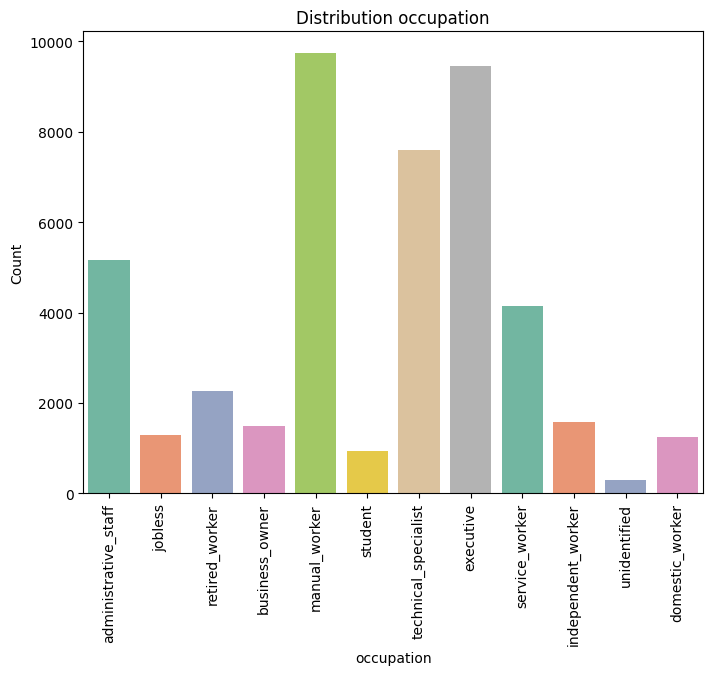

In [24]:
plt.figure(figsize=(8,6))
sns.countplot(x='occupation',palette='Set2', data=df)
plt.xticks(rotation=90)

plt.title('Distribution occupation')
plt.xlabel('occupation')
plt.ylabel('Count')
plt.show()

Based on the provided graph, administrative_staff is the most common occupation. It has the highest number of individuals in the dataset.

## Age Distribution (Histogram)

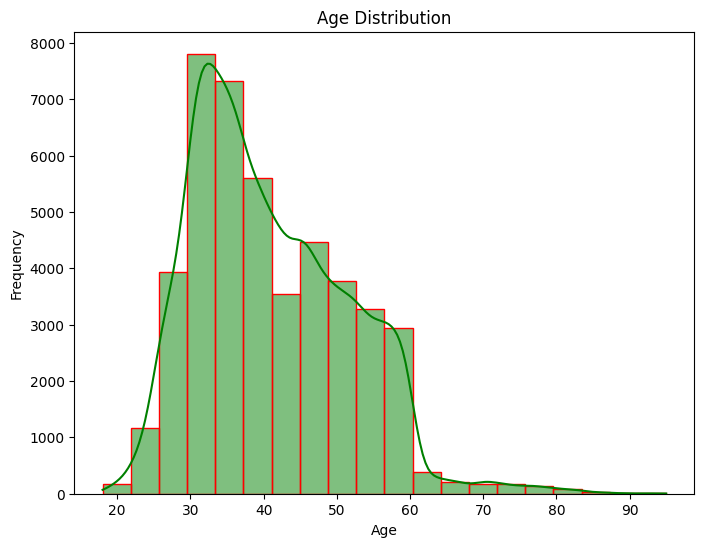

In [25]:
plt.figure(figsize=(8,6))
sns.histplot(df['age'], bins=20, color='green', edgecolor='red', kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

The Age Distribution histogram shows how the ages of individuals are spread across the dataset. Most individuals fall within a middle age range, with peaks around certain age groups. This helps in identifying patterns, such as potential age groups that are more responsive to the marketing campaign.

 ## Marital Status Distribution (Bar Chart)

C:\Users\amald\AppData\Local\Temp\ipykernel_10996\1162487826.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='marital_status', palette='Set2')


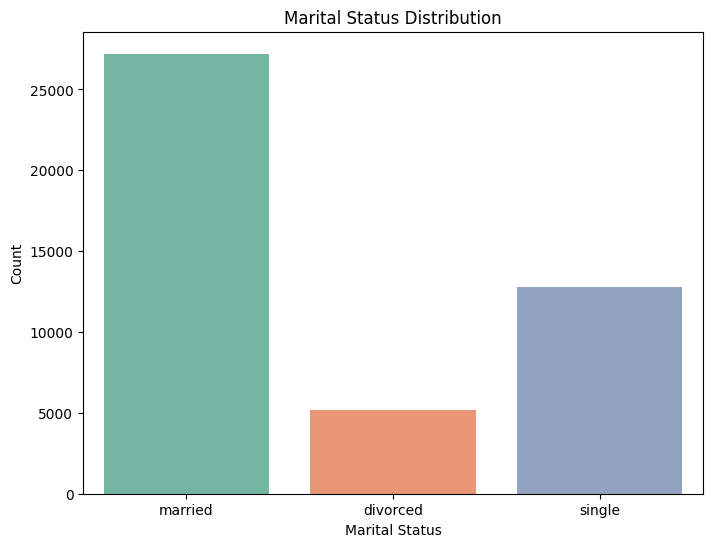

In [26]:
plt.figure(figsize=(8,6))
sns.countplot(data=df, x='marital_status', palette='Set2')
plt.title('Marital Status Distribution')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.show()

The Marital Status Distribution bar chart shows that most individuals in the dataset are married, followed by single and divorced individuals. This helps in understanding the demographic distribution and can be used to explore how marital status might influence conversion rates in the marketing campaign.

## 

## Call Duration Distribution (Histogram)
This plot will show the distribution of call duration across the dataset. It can help identify the average call length and whether shorter or longer calls are more frequent.

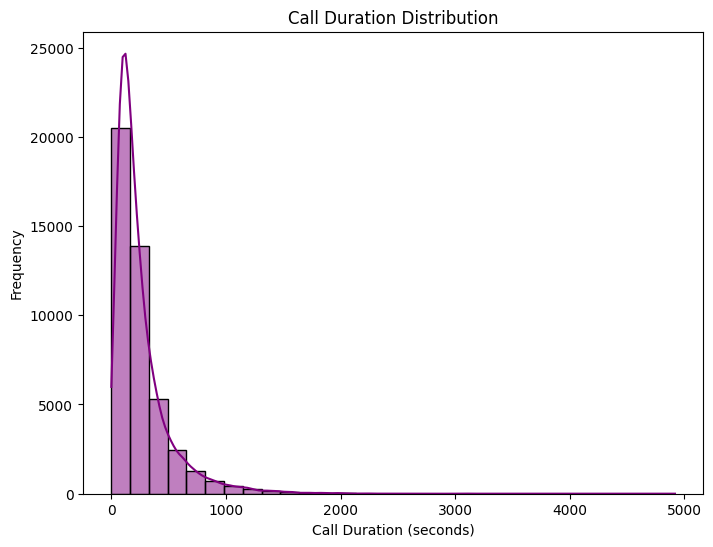

In [27]:
plt.figure(figsize=(8,6))
sns.histplot(df['call_duration'], bins=30, kde=True, color='purple')
plt.title('Call Duration Distribution')
plt.xlabel('Call Duration (seconds)')
plt.ylabel('Frequency')
plt.show()

In [28]:
df.head(2)

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome,conversion_status
0,administrative_staff,28,high_school,married,unidentified,September,9,1,1,successful,not_converted
1,administrative_staff,58,unidentified,married,unidentified,June,5,307,2,unidentified,not_converted


## distribution of call month

C:\Users\amald\AppData\Local\Temp\ipykernel_10996\2988335071.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='call_month', palette='coolwarm', order=month_order)


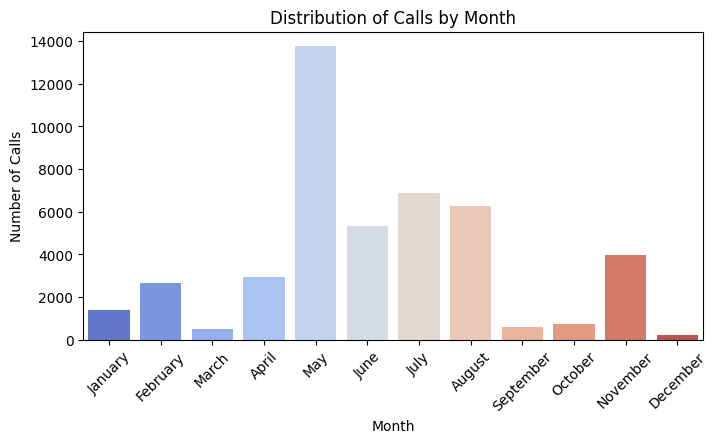

In [29]:
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']

# Plot: Distribution of Call Months (Bar Chart) with sorted months
plt.figure(figsize=(8,4))
sns.countplot(data=df, x='call_month', palette='coolwarm', order=month_order)
plt.title('Distribution of Calls by Month')
plt.xlabel('Month')
plt.ylabel('Number of Calls')
plt.xticks(rotation=45)
plt.show()

This visualization will show the distribution of marketing calls across different months. You may observe that some months, such as June or September, have a higher number of calls compared to others. This could reflect the campaign's schedule or seasonal customer behavior.

For instance, if more calls were made during the mid-year months (e.g., June, July), it might suggest a peak campaign period, while fewer calls in other months could indicate off-peak periods. This distribution can also help in analyzing how seasonality affects conversion rates.

## Call Frequency per Day of the Month (Bar Chart)
This bar chart will show how often calls were made on different days of the month. It's useful for understanding any patterns in call activity.

C:\Users\amald\AppData\Local\Temp\ipykernel_10996\4151197365.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df, x='call_day', palette='coolwarm')


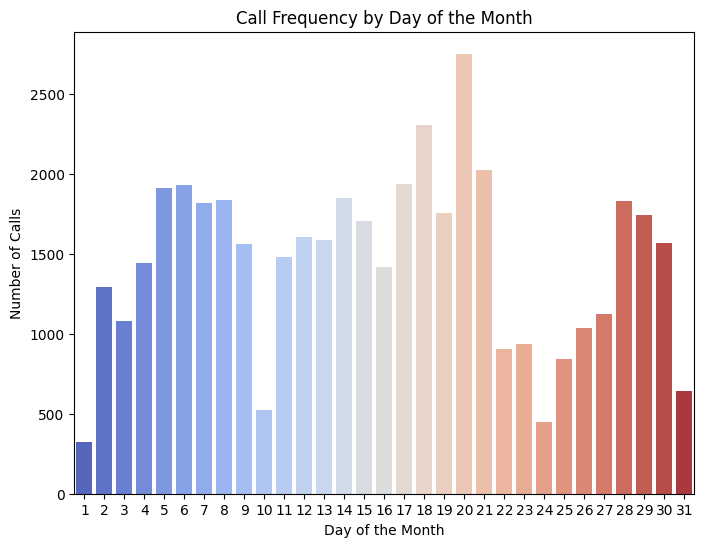

In [30]:
plt.figure(figsize=(8,6))
sns.countplot(data=df, x='call_day', palette='coolwarm')
plt.title('Call Frequency by Day of the Month')
plt.xlabel('Day of the Month')
plt.ylabel('Number of Calls')
plt.show()

## Education Level vs Conversion Rate (Bar Chart)
Here, we will explore how different education levels relate to the conversion rate

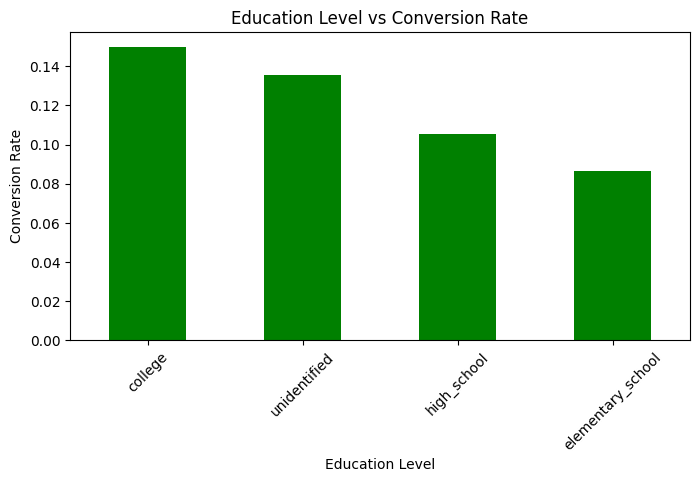

In [31]:
conversion_rate_by_education = df.groupby('education_level')['conversion_status'].value_counts(normalize=True).unstack().fillna(0)

plt.figure(figsize=(8,4))
conversion_rate_by_education['converted'].sort_values(ascending=False).plot(kind='bar', color='green')
plt.title('Education Level vs Conversion Rate')
plt.xlabel('Education Level')
plt.ylabel('Conversion Rate')
plt.xticks(rotation=45)
plt.show()

## Previous Campaign Outcome vs Conversion Rate (Stacked Bar Chart)
This stacked bar chart will visualize the relationship between the previous campaign's outcome and the conversion status.

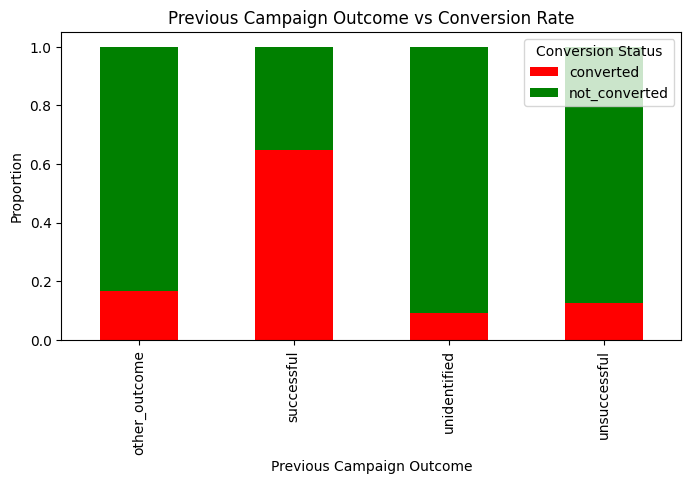

In [32]:
previous_campaign_conversion = pd.crosstab(df['previous_campaign_outcome'], df['conversion_status'], normalize='index')

previous_campaign_conversion.plot(kind='bar', stacked=True, figsize=(8,4), color=['red', 'green'])
plt.title('Previous Campaign Outcome vs Conversion Rate')
plt.xlabel('Previous Campaign Outcome')
plt.ylabel('Proportion')
plt.legend(title='Conversion Status', loc='upper right')
plt.show()

## Call Duration vs Conversion Status (Box Plot)
This box plot will help compare the distribution of call durations between converted and non-converted customers.

C:\Users\amald\AppData\Local\Temp\ipykernel_10996\2358179811.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='conversion_status', y='call_duration', data=df, palette='Set3')


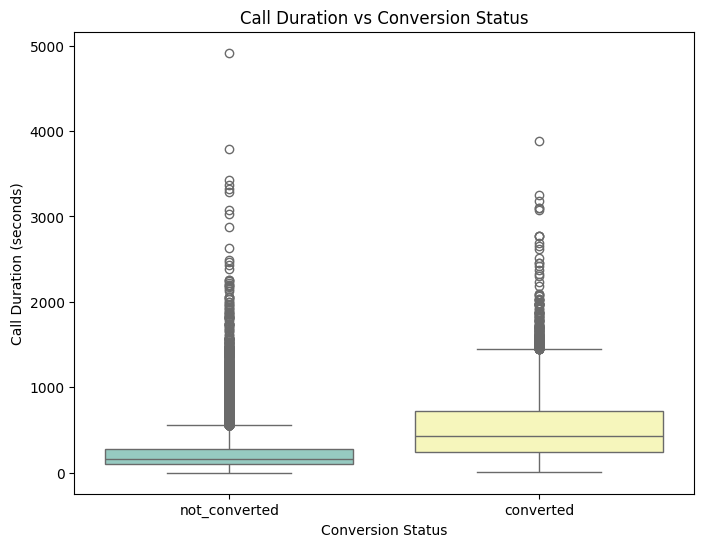

In [33]:
plt.figure(figsize=(8,6))
sns.boxplot(x='conversion_status', y='call_duration', data=df, palette='Set3')
plt.title('Call Duration vs Conversion Status')
plt.xlabel('Conversion Status')
plt.ylabel('Call Duration (seconds)')
plt.show()

## Call Duration vs Conversion Status:
* The box plot for call duration vs conversion status might reveal that converted customers tend to have longer call durations on average.
* This can suggest that investing more time during a call improves the chances of conversion, and call duration might be a key performance metric for success.

In [34]:
df.head(2)

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome,conversion_status
0,administrative_staff,28,high_school,married,unidentified,September,9,1,1,successful,not_converted
1,administrative_staff,58,unidentified,married,unidentified,June,5,307,2,unidentified,not_converted


## Which communication medium is most commonly  used?

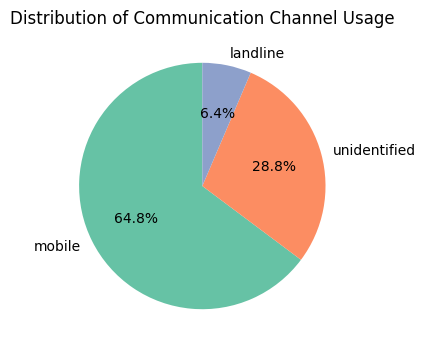

In [35]:
plt.figure(figsize=(8,4))
channel_counts = df['communication_channel'].value_counts()
plt.pie(channel_counts, labels=channel_counts.index, autopct='%1.1f%%', startangle=90, colors=sns.color_palette('Set2'))
plt.title('Distribution of Communication Channel Usage')
plt.show()

Mobile is the most commonly used communication channel, accounting for 64.8% of the total usage.

In [36]:
df.head(2)

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome,conversion_status
0,administrative_staff,28,high_school,married,unidentified,September,9,1,1,successful,not_converted
1,administrative_staff,58,unidentified,married,unidentified,June,5,307,2,unidentified,not_converted


In [37]:
pd.crosstab(index=df["education_level"], columns = df["conversion_status"])


conversion_status,converted,not_converted
education_level,,
college,1996,11303
elementary_school,591,6259
high_school,2450,20749
unidentified,252,1605


## Which education level has the highest number of conversions?


Text(0.5, 1.0, 'conversion ststus vs education')

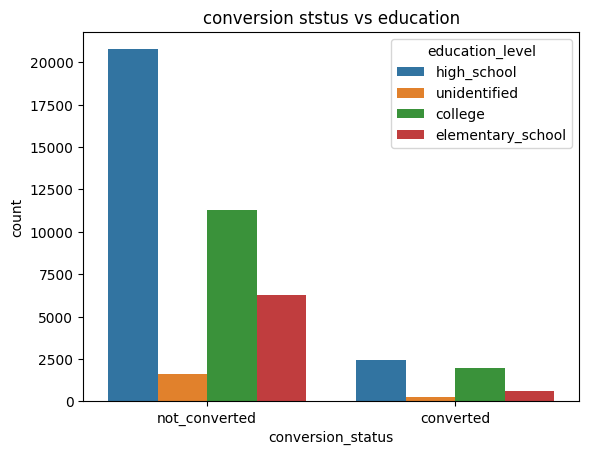

In [38]:
sns.countplot(df, x='conversion_status',hue='education_level' )
plt.title('conversion ststus vs education')


Based on the provided bar chart, high_school has the highest number of conversions.

## Which marital status group uses mobile communication the most?

In [39]:
pd.crosstab(index=df['marital_status'], columns=df['communication_channel'])


communication_channel,landline,mobile,unidentified
marital_status,,,
divorced,271,3326,1610
married,2015,17166,8029
single,620,8790,3378


Text(0.5, 1.0, 'martial status vs communication channel')

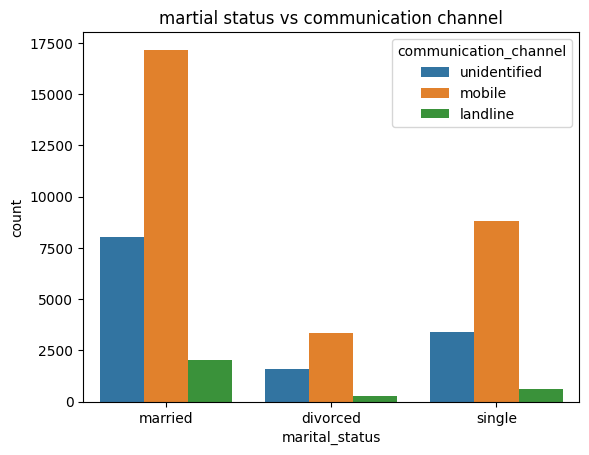

In [42]:
sns.countplot(df, x='marital_status', hue='communication_channel')
plt.title('martial status vs communication channel')


Based on the provided bar chart, married individuals use mobile communication the most. The bar representing mobile communication for the married group is the tallest among all the bars representing mobile communication for different marital statuses.

## Which previous campaign outcome has the highest number of conversions?


In [414]:
pd.crosstab(index=df['conversion_status'], columns=df['previous_campaign_outcome'])


previous_campaign_outcome,other_outcome,successful,unidentified,unsuccessful
conversion_status,,,,
converted,307,978,3386,618
not_converted,1533,533,33567,4283


Text(0.5, 1.0, ' conversion ststus vs campaign outcome')

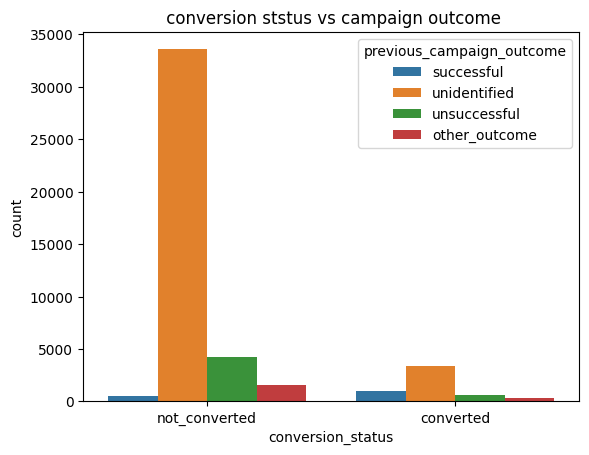

In [43]:
sns.countplot(df,x='conversion_status', hue='previous_campaign_outcome')
plt.title(' conversion ststus vs campaign outcome')


Based on the provided bar chart, unidentified previous campaign outcome has the highest number of conversions.

## Encoding

#### Encode Categorical Variables: We need to transform categorical variables into a format that can be used by machine learning models. This typically involves converting categories into numerical values using one-hot encoding or label encoding.



In [416]:
from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.compose import ColumnTransformer

le = LabelEncoder()
for column in ['occupation', 'education_level', 'marital_status', 'communication_channel','call_month', 
               'previous_campaign_outcome', 'conversion_status']:
    df[column] = le.fit_transform(df[column])

###  After creating the LabelEncoder object, use its methods, such as fit_transform(), to encode categorical labels into numerical values.


In [417]:
df.head(5)

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome,conversion_status
0,0,28,2,1,2,11,9,1,1,1,1
1,0,58,3,1,2,6,5,307,2,2,1
2,5,40,2,0,1,3,4,113,1,2,1
3,7,63,2,1,1,0,7,72,5,2,1
4,1,43,0,1,0,5,29,184,4,2,1


### Droping conversio status it target column


In [418]:
X=df.drop("conversion_status",axis=1)
y=df["conversion_status"]

### Spliting dataset into traing and testing¶
* train_test_split function divides into two sets: training set (X_train, y_train) and testing set (X_test, y_test).

In [419]:
X=df.drop("conversion_status",axis=1)
y=df["conversion_status"]



X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [420]:
X_test

,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome
22091,6,33,1,2,2,8,7,102,1,2
22762,10,46,2,1,0,5,31,43,5,2
44927,3,41,0,1,2,6,20,7,3,2
8807,3,29,0,2,1,4,28,154,2,3
18647,3,49,1,2,0,5,31,115,6,2
...,...,...,...,...,...,...,...,...,...,...
3344,6,32,2,2,1,5,28,86,4,2
10135,6,33,2,1,1,0,7,1063,1,2
21082,3,32,2,2,2,8,23,139,1,2
13596,10,46,2,0,2,8,26,200,3,2


In [421]:
X_train


,occupation,age,education_level,marital_status,communication_channel,call_month,call_day,call_duration,call_frequency,previous_campaign_outcome
23090,0,32,2,0,1,5,14,90,2,2
6633,3,46,0,2,2,6,18,107,1,2
313,6,51,1,1,2,8,26,153,1,2
16522,8,41,1,0,1,5,31,73,1,2
44313,6,29,1,1,2,8,28,165,1,2
...,...,...,...,...,...,...,...,...,...,...
11284,10,46,2,1,2,6,5,92,1,2
44738,8,47,2,1,2,6,12,112,1,2
38162,6,39,2,1,1,9,21,239,2,3
860,4,32,0,1,1,9,20,228,1,2


In [422]:
X_train.shape


(36164, 10)

In [423]:
X_test.shape


(9041, 10)

In [424]:
#Extracting Independent and dependent Variable
x= df.iloc[:,1:-1].values
y= df.iloc[:,-1].values

In [425]:
# Splitting the dataset into training and test set.

from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size= 0.25,random_state=0)

In [426]:
#feature Scaling
from sklearn.preprocessing import StandardScaler
st_x= StandardScaler()
x_train= st_x.fit_transform(x_train)
x_test= st_x.fit_transform(x_test)

* ## Bulding model with Support vector classifier


* SVC finds the optimal boundary (or hyperplane) that separates different classes of data with the largest margin.
* It uses support vectors (closest data points) to define this boundary and can handle non-linear data with a technique called the kernel trick.
* Support vector classifier() creates an instance of the Support vector classifier algorithm and assigns it to the variable SVC.


In [427]:
from sklearn.svm import SVC # "Support vector classifier"
classifier = SVC(kernel='linear', random_state=0)
classifier.fit(x_train, y_train)

#Predicting the test set result
y_pred= classifier.predict(x_test)


svc= accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f' % (accuracy*100))

Accuracy: 88.28


* ## Bulding model with KNeighborsClassifier

* The KNeighborsClassifier algorithm is a type of instance-based or lazy learning algorithm used for classification task.
* KNN can be applied to both classification and regression tasks.
* KNeighborsClassifier() creates an instance of the KNeighborsClassifier algorithm and assigns it to the variable knn.



In [428]:
 #Fitting K-NN classifier to the training set
from sklearn.neighbors import KNeighborsClassifier
 #n_neighbors: To define the required neighbors of the algorithm.Usually, it takes 5.
 #metric='minkowski': This is the default parameter and it decides thedistance between the points.
 #p=2: It is equivalent to the standard Euclidean metric.
classifier= KNeighborsClassifier(n_neighbors=5, metric='minkowski',p=2 )
classifier.fit(x_train, y_train)
 #Predicting the test set result
y_pred= classifier.predict(x_test)
print(y_pred)
print("Prediction comparison")
ddf=pd.DataFrame({"Y_test":y_test,"Y-pred":y_pred})
print(ddf.to_string())
 # evaluate predictions
KNN= accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f' % (accuracy*100))


[1 1 1 ... 1 1 1]
Prediction comparison
       Y_test  Y-pred
0           1       1
1           1       1
2           1       1
3           1       1
4           1       1
5           1       1
6           1       1
7           1       1
8           1       1
9           1       0
10          1       1
11          1       1
12          1       1
13          1       1
14          1       1
15          1       1
16          1       1
17          1       1
18          1       1
19          1       1
20          1       1
21          1       1
22          1       1
23          1       1
24          1       1
25          1       1
26          1       1
27          1       1
28          1       1
29          1       1
30          1       1
31          0       1
32          1       1
33          1       1
34          1       1
35          1       1
36          1       1
37          1       1
38          1       1
39          1       1
40          1       1
41          1       1
42          0 

* ## Bulding model with  Naïve Bayes Classifier




* Naive Bayes classifier is a  supervised learning algorithm based on _Bayes' Theorem_ , assuming that features are independent of each other.
* It works well for tasks like spam detection and text classification, where this independence assumption often holds.
* It calculates the probability of each class and selects the one with the highest likelihood for classification.
* Naïve Bayes Classifier() creates an instance of the Naïve Bayes Classifier algorithm and assigns it to the variable NGB


In [429]:
# Fitting Naive Bayes to the Training set
from sklearn.naive_bayes import GaussianNB
classifier = GaussianNB()
classifier.fit(x_train, y_train)
 #Prediction of the test set result:
 # Predicting the Test set results
y_pred = classifier.predict(x_test)
print("------------PREDICTION----------")
df2=pd.DataFrame({"Actual Result-Y":y_test,"PredictionResult":y_pred})
print(df2.to_string())
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error:',
np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
 # evaluate predictions
NGB= accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f' % (accuracy*100))


------------PREDICTION----------
       Actual Result-Y  PredictionResult
0                    1                 1
1                    1                 1
2                    1                 1
3                    1                 1
4                    1                 1
5                    1                 1
6                    1                 1
7                    1                 1
8                    1                 1
9                    1                 1
10                   1                 1
11                   1                 1
12                   1                 1
13                   1                 1
14                   1                 1
15                   1                 1
16                   1                 1
17                   1                 1
18                   1                 1
19                   1                 1
20                   1                 1
21                   1                 1
22                   1  

* ## Bulding model with Decision TreeClassifier

* Decision trees can handle both numerical and categorical data without requiring one-hot encoding for categorical variables.
* Decision trees are less sensitive to outliers and missing values compared to some other algorithms, reducing the need for extensive data preprocessing.
* Decision TreeClassifier() creates an instance of the DecisionTreeRegressor algorithm and assigns it to the variable DTC.


In [430]:
#Fitting Decision Tree classifier to the training set
from sklearn.tree import DecisionTreeClassifier
classifier= DecisionTreeClassifier(criterion='entropy', random_state=0)
classifier.fit(x_train, y_train)
 #Predicting the test set result
y_pred= classifier.predict(x_test)
df2=pd.DataFrame({"Actual Y_Test":y_test,"PredictionData":y_pred})
print("Prediction Result")
print(df2.to_string())
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error:',
np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
from sklearn.metrics import accuracy_score
 # evaluate predictions
DTC= accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f' % (accuracy*100))

Prediction Result
       Actual Y_Test  PredictionData
0                  1               1
1                  1               1
2                  1               1
3                  1               1
4                  1               1
5                  1               1
6                  1               1
7                  1               1
8                  1               1
9                  1               1
10                 1               1
11                 1               1
12                 1               1
13                 1               1
14                 1               1
15                 1               1
16                 1               1
17                 1               1
18                 1               1
19                 1               1
20                 1               1
21                 1               1
22                 1               1
23                 1               0
24                 1               1
25                 1

* ## Bulding model with RandomForestClassifier


* Random Forests often achieve high accuracy in classification tasks. They are robust against overfitting, especially when compared to individual decision trees, because they aggregate predictions from multiple trees (ensemble method).
* Random Forests can handle missing values in the dataset without requiring imputation.
* RandomForestClassifier() creates an instance of the RandomForestClassifier algorithm and assigns it to the variable RFC.





In [431]:
 #Fitting RandomForestClassifier to the training set
from sklearn.ensemble import RandomForestClassifier
classifier= RandomForestClassifier(n_estimators= 10,criterion="entropy")
classifier.fit(x_train, y_train)
 #Predicting the test set result
y_pred= classifier.predict(x_test)
print("------------PREDICTION----------")
df2=pd.DataFrame({"Actual Result-Y":y_test,"PredictionResult":y_pred})
print(df2.to_string())
from sklearn import metrics
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test,y_pred))
print('Mean Squared Error:', metrics.mean_squared_error(y_test,y_pred))
print('Root Mean Squared Error:',
np.sqrt(metrics.mean_squared_error(y_test, y_pred)))
from sklearn.metrics import accuracy_score
 # evaluate predictions
RFC= accuracy = accuracy_score(y_test, y_pred)
print('Accuracy: %.2f' % (accuracy*100))

------------PREDICTION----------
       Actual Result-Y  PredictionResult
0                    1                 1
1                    1                 1
2                    1                 1
3                    1                 1
4                    1                 1
5                    1                 1
6                    1                 1
7                    1                 1
8                    1                 1
9                    1                 1
10                   1                 1
11                   1                 1
12                   1                 1
13                   1                 1
14                   1                 1
15                   1                 1
16                   1                 1
17                   1                 1
18                   1                 1
19                   1                 1
20                   1                 1
21                   1                 1
22                   1  

# Ploting All Algorithm 

In [432]:
acc=[]
acc.append(RFC)
acc.append(DTC)
acc.append(NGB)
acc.append(KNN)
acc.append(svc)


In [433]:
alg=['RFC','DTC','NBG','KNN','SVC']

C:\Users\amald\AppData\Local\Temp\ipykernel_33528\4236465333.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=acc,y=alg,palette='husl')


Text(0.5, 1.0, 'Accuracy score')

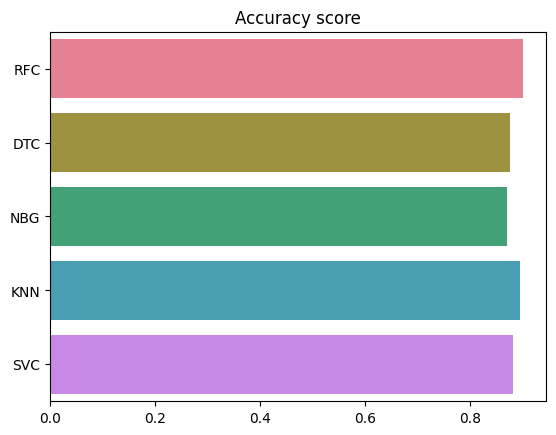

In [434]:
import seaborn as sns 
sns.barplot(x=acc,y=alg,palette='husl')
plt.title('Accuracy score')

In [435]:
RFC

0.9009024951336047

In [436]:
DTC

0.8763935586621837

In [437]:
NGB

0.8705538842682711

In [438]:
KNN

0.8963900194655813

In [439]:
svc

0.8827641125464519

## Conclusion


#### After doing all tha analysis and model fiting i can say Random Forest has a higher accuracy, so it is a better model.
